In [1]:
import time

from IPython.core.display_functions import display
from PIL import Image

import numpy as np
import cv2 as cv
import pandas as pd
from torchvision.transforms import PILToTensor
from IPython.display import clear_output

%load_ext autoreload
%autoreload 2

/home/pasquale/projects/Self-Supervised-Learning-for-Precision-Agriculture/venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
img = Image.open("./dataset/DJI_1020_0.JPG")

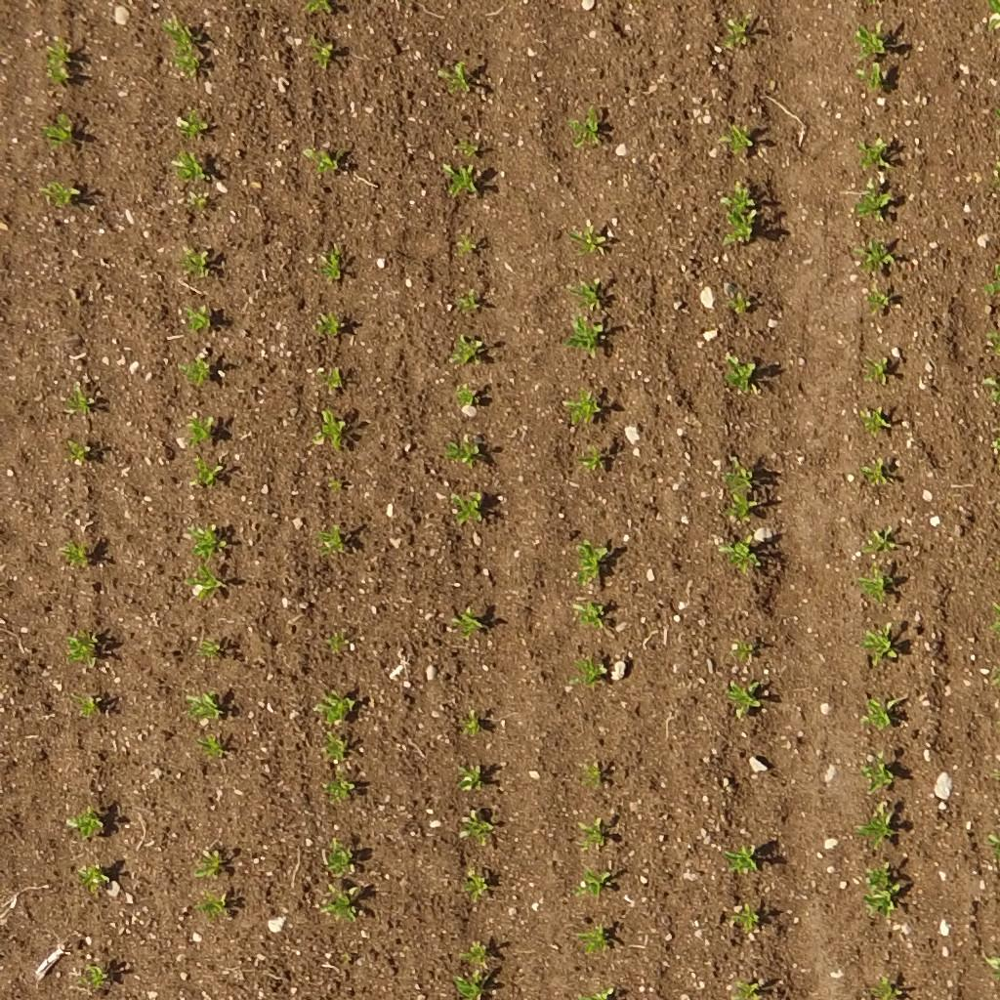

In [5]:
img

In [6]:
t = PILToTensor()(img)

In [35]:
exg = 2*t[0]- (t[1] + t[2])
g = t[0]
exg = exg.numpy()
g = g.numpy()

In [36]:
print(exg)

[[106 106 106 ...  76  84  87]
 [106 106 106 ...  74  82  84]
 [106 106 106 ...  70  77  83]
 ...
 [108 108 108 ... 110 110 110]
 [108 108 108 ... 110 110 110]
 [108 108 108 ... 110 110 110]]


In [37]:
ret, otsu = cv.threshold(exg,0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)
otsu =  np.where(otsu == 0, 255, 0).astype(np.uint8)

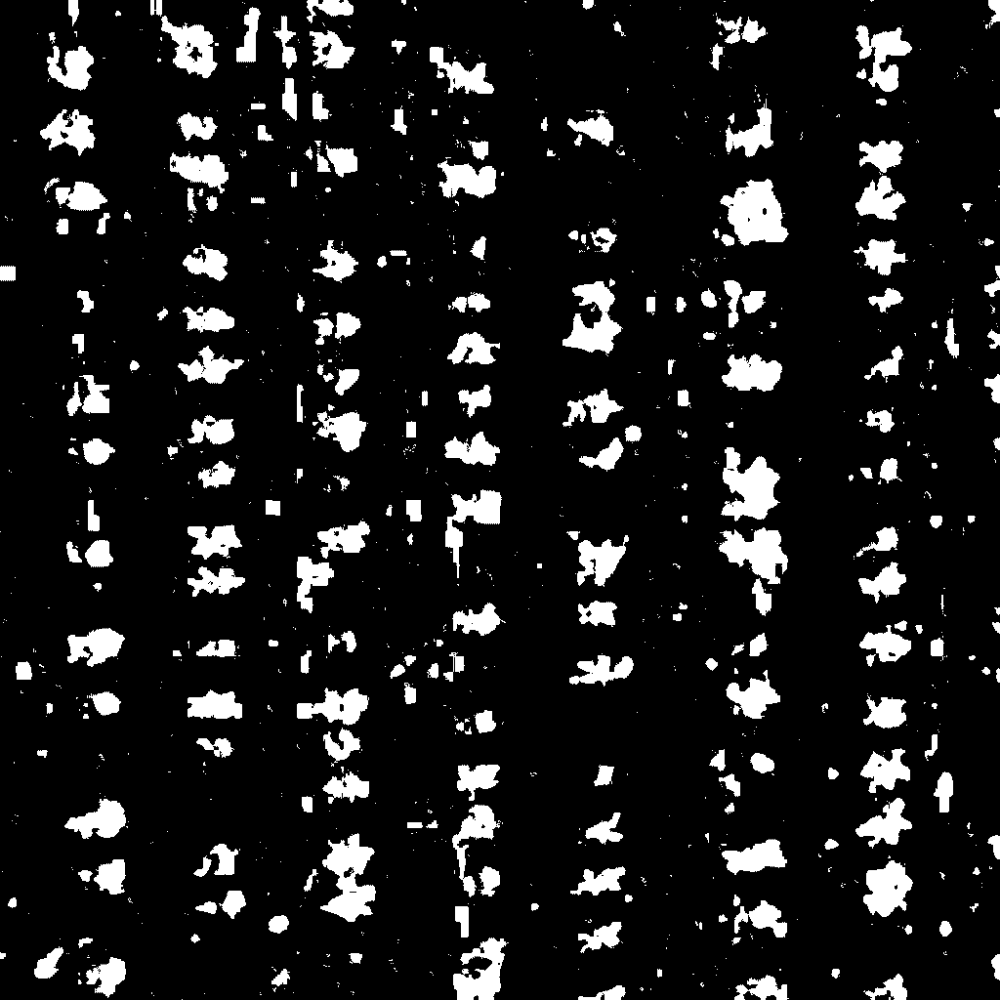

In [38]:
Image.fromarray(otsu)

In [114]:
lines = cv.HoughLines(otsu,1,np.pi/180,1500)

In [115]:
imgp = np.array(img)

In [116]:
for item in lines:
    rho,theta = item[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv.line(imgp,(x1,y1),(x2,y2),(0,0,255),2)

In [ ]:
bin_img = cv

In [167]:
connectivity = 4
(num_labels, labels, stats, centroids) = cv.connectedComponentsWithStats(otsu, connectivity=connectivity, ltype=cv.CV_32S)

In [217]:
num_pixels = stats[:, 4]
series = pd.Series(num_pixels)
non_trivial = series[series > 10]

In [223]:
labels.shape

(1024, 1024)

In [244]:
df = pd.DataFrame({"cx": centroids[:, 0], "cy": centroids[:, 1], "num_pixels": num_pixels})

In [245]:
reduced = df[df['num_pixels'] > 10]

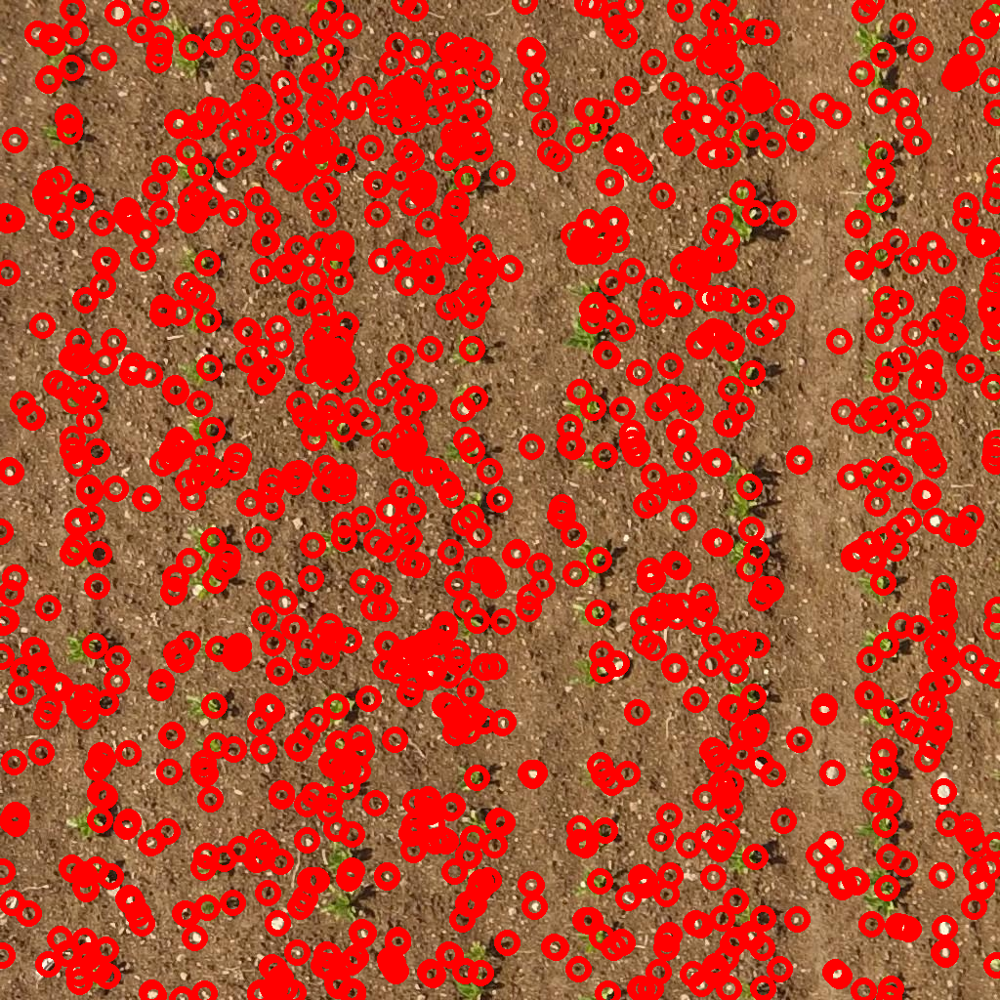

In [214]:
imgc = np.array(img)
for x, y, num_pixels in df:
    cv.circle(imgc, (int(x), int(y)), 10, (255, 0, 0), 5)
Image.fromarray(imgc)

In [168]:
label_hue = np.uint8(179*labels/np.max(labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv.merge([label_hue, blank_ch, blank_ch])

# Converting cvt to BGR
labeled_img = cv.cvtColor(labeled_img, cv.COLOR_HSV2BGR)
# set bg label to black
labeled_img[label_hue==0] = 0
cv.cvtColor(labeled_img, cv.COLOR_BGR2RGB)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

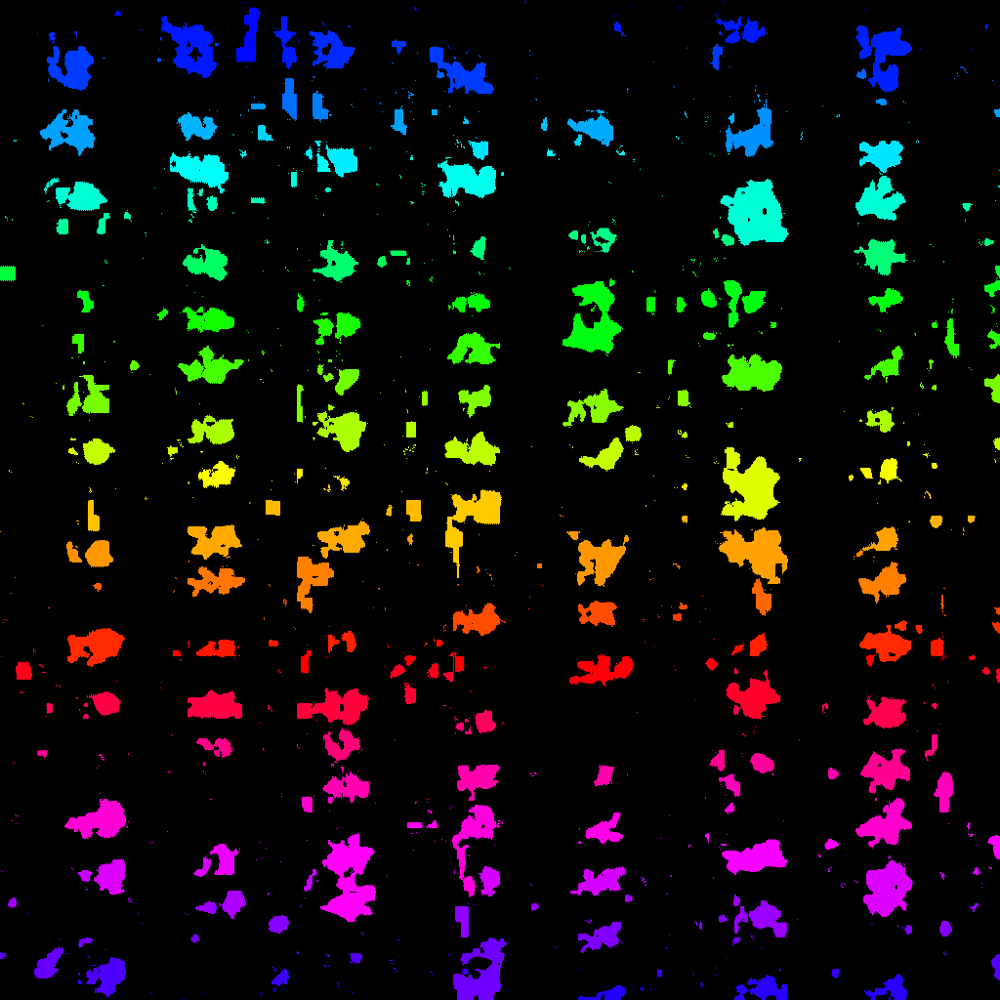

In [169]:
Image.fromarray(labeled_img)

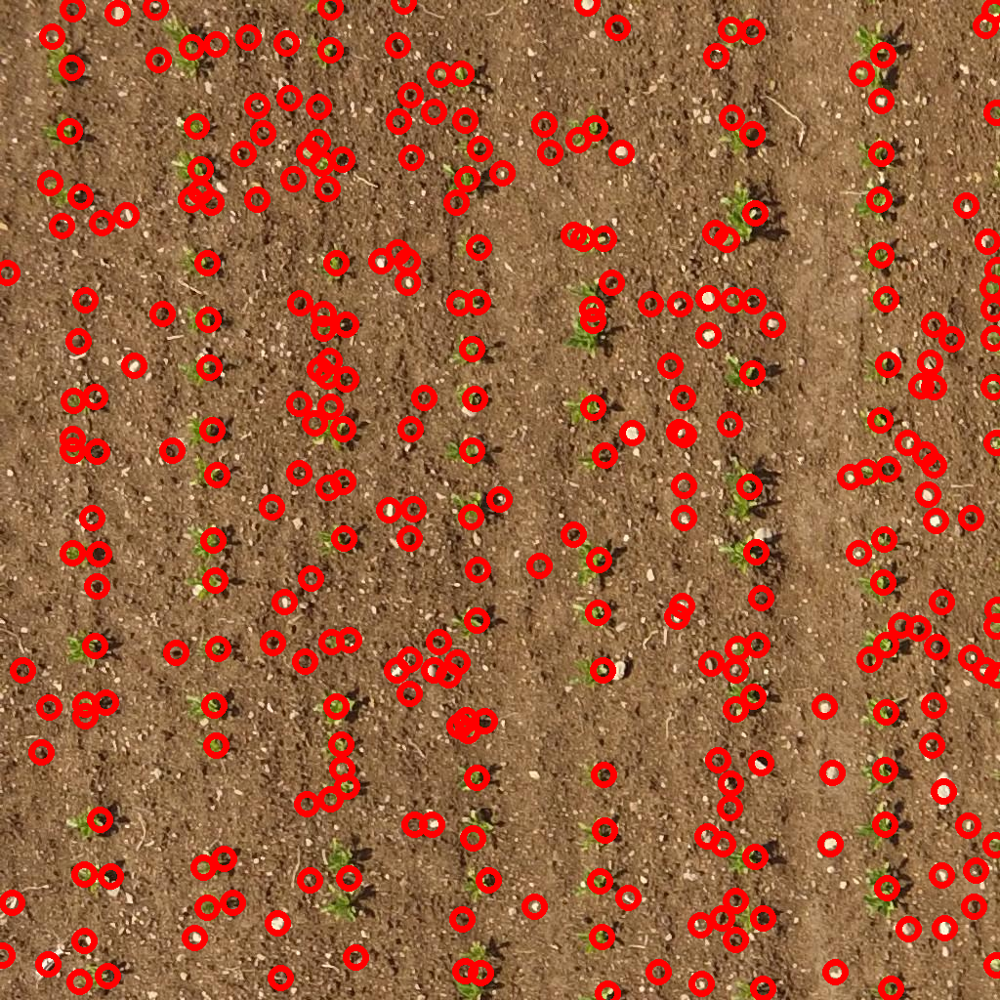

In [247]:
imgc = np.array(img)
for i, row in reduced.iterrows():
    cv.circle(imgc, (int(row['cx']), int(row['cy'])), 10, (255, 0, 0), 5)
Image.fromarray(imgc)

---
## Laweed

In [4]:
import torch
from ezdl.models.lawin import Laweed
from ezdl.datasets import WeedMapDatasetInterface
from torchvision.transforms import Normalize, Compose, ToTensor, Resize

redirects -WARNING- NOTE: Redirects are currently not supported in Windows or MacOs.
callbacks -WARNING- Failed to import deci_lab_client
deci_platform_sg_logger -WARNING- Failed to import deci_lab_client


C:\Users\pasqu\Desktop\Pasquale\Progetti\PHD\SSL-PA\venv\lib\site-packages\_distutils_hack\__init__.py:36: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


quantization_utils -WARNING- Failed to import pytorch_quantization
env_sanity_check -INFO- ** A sanity check is done when importing super_gradients for the first time. **
-> You can see the details by setting the env variable DISPLAY_SANITY_CHECK=True prior to import.


In [5]:
model_path = "Laweed-1v1r4nzz_latest.pth"
pth = torch.load(model_path)
model = Laweed({'output_channels': 3, 'num_classes': 3, 'backbone': 'MiT-B0', 'backbone_pretrained': True})
weights = {k[7:]: v for k, v in pth['net'].items()}
model.load_state_dict(weights)
model.eval()

Some weights of the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 were not used when initializing SegformerModel: ['decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.0.proj.weight', 'decode_head.classifier.bias', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.bias', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.batch_norm.running_var', 'decode_head.linear_c.1.proj.weight', 'decode_head.batch_norm.running_mean', 'decode_head.classifier.weight', 'decode_head.linear_fuse.weight', 'decode_head.batch_norm.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_c.0.proj.bias']
- This IS expected if you are initializing SegformerModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Segforme

Laweed(
  (backbone): MiT(
    (encoder): SegformerModel(
      (encoder): SegformerEncoder(
        (patch_embeddings): ModuleList(
          (0): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
            (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
          )
          (1): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
          )
          (2): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
          )
          (3): SegformerOverlapPatchEmbeddings(
            (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (layer_norm): LayerNorm((256,), eps=1e-05, 

In [6]:
# means = [0.5653257966041565, 0.5183065533638, 0.36572086811065674]
# stds = [0.19733895361423492, 0.17325463891029358, 0.17409144341945648]

means, stds = WeedMapDatasetInterface.get_mean_std(['000', '001', '002', '004'], ['R', 'G', 'B'], 'rededge')

In [7]:
trans = Compose([ToTensor(), Normalize(means, stds)])
# trans = Compose([ToTensor(), Normalize(means, stds), Resize(256)])

In [8]:
in_img = torch.unsqueeze(trans(img), 0)

In [9]:
seg = model(in_img)

In [10]:
seg_class = seg.argmax(1)

In [11]:
seg_class[seg_class == 2] = 255
seg_class[seg_class == 1] = 255

In [12]:
torch.bincount(seg_class.flatten())

tensor([1033593,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,       0,       0,       0,       0,       0,
              0,       0,       0,      

In [13]:
seg_img_np = seg_class.squeeze(0).cpu().numpy().astype(np.uint8)
seg_img = Image.fromarray(seg_img_np)

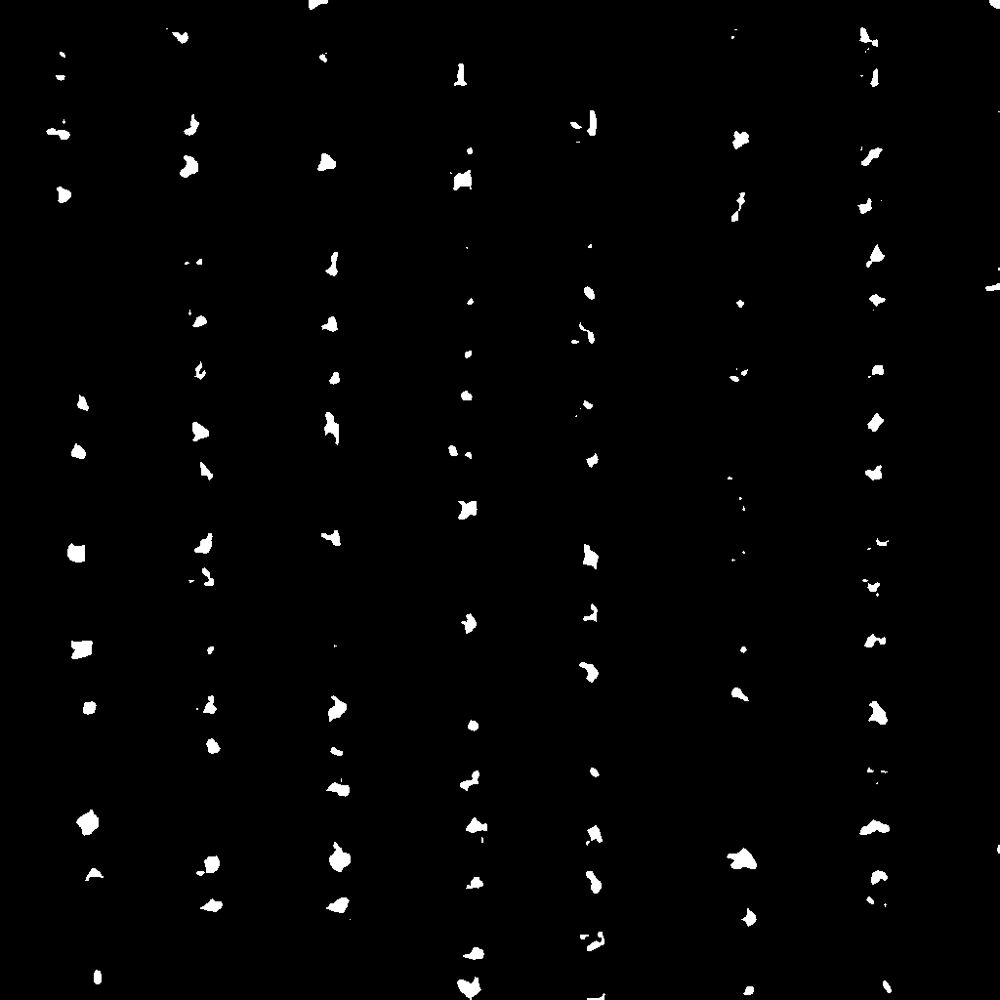

In [14]:
seg_img

---
## Connectivity

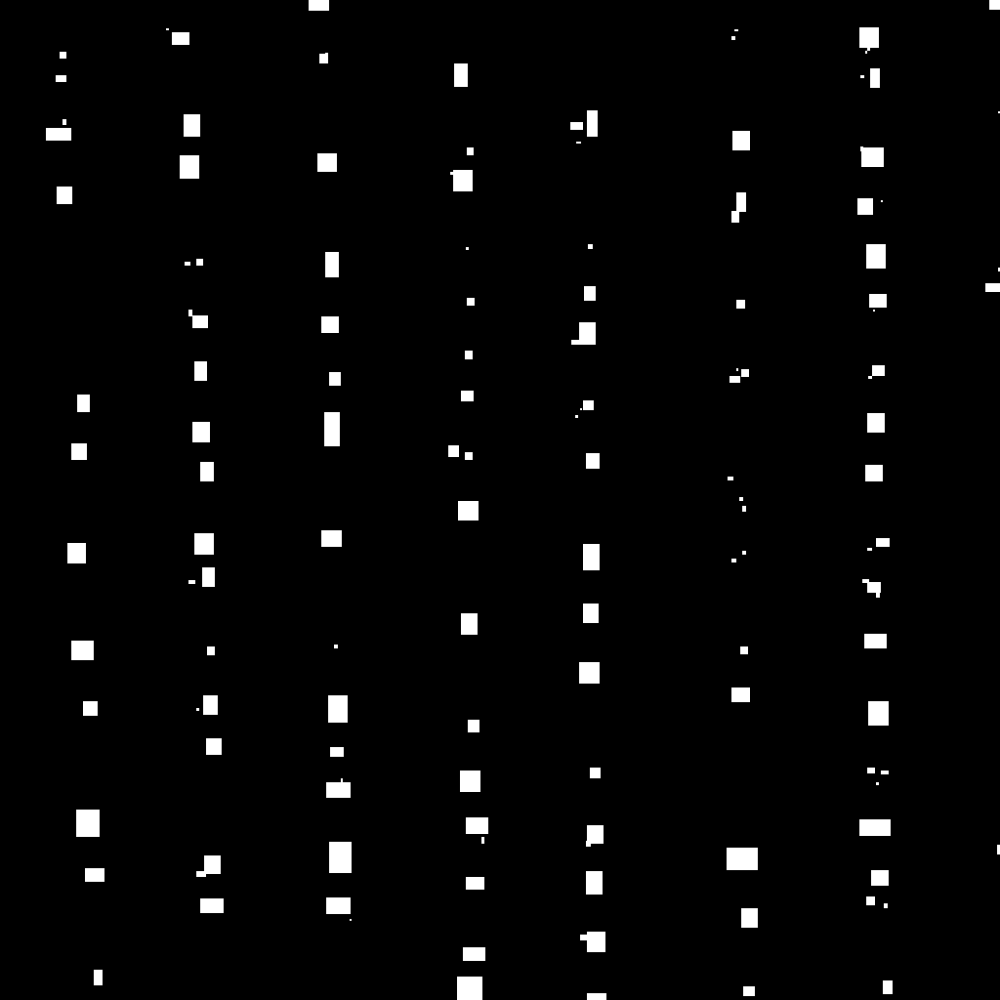

In [15]:
connectivity = 4
(num_labels, labels, stats, centroids) = cv.connectedComponentsWithStats(seg_img_np, connectivity=connectivity,
                                                                         ltype=cv.CV_32S)
num_pixels = stats[:, 4]
series = pd.Series(num_pixels)
non_trivial = series[series > 10]
df = pd.DataFrame({"cx": centroids[:, 0], "cy": centroids[:, 1],
                   "bx": stats[:, 0], "by": stats[:, 1], "width": stats[:, 2], "height": stats[:, 3],
                   "num_pixels": num_pixels})
imgc = np.array(img)
mask = np.zeros(imgc.shape, dtype=np.uint8)
df = df.drop(0)
for idx, (x, y, bx, by, width, height, num_pixels) in df.iterrows():
    c1 = int(bx), int(by)
    c2 = int(bx + width), int(by + height)
    # cv.circle(imgc, (int(x), int(y)), 10, (255, 0, 0), 5)
    cv.rectangle(imgc, c1, c2, (255, 0, 0), -1)
    cv.rectangle(mask, c1, c2, (255, 255, 255), -1)
Image.fromarray(mask)

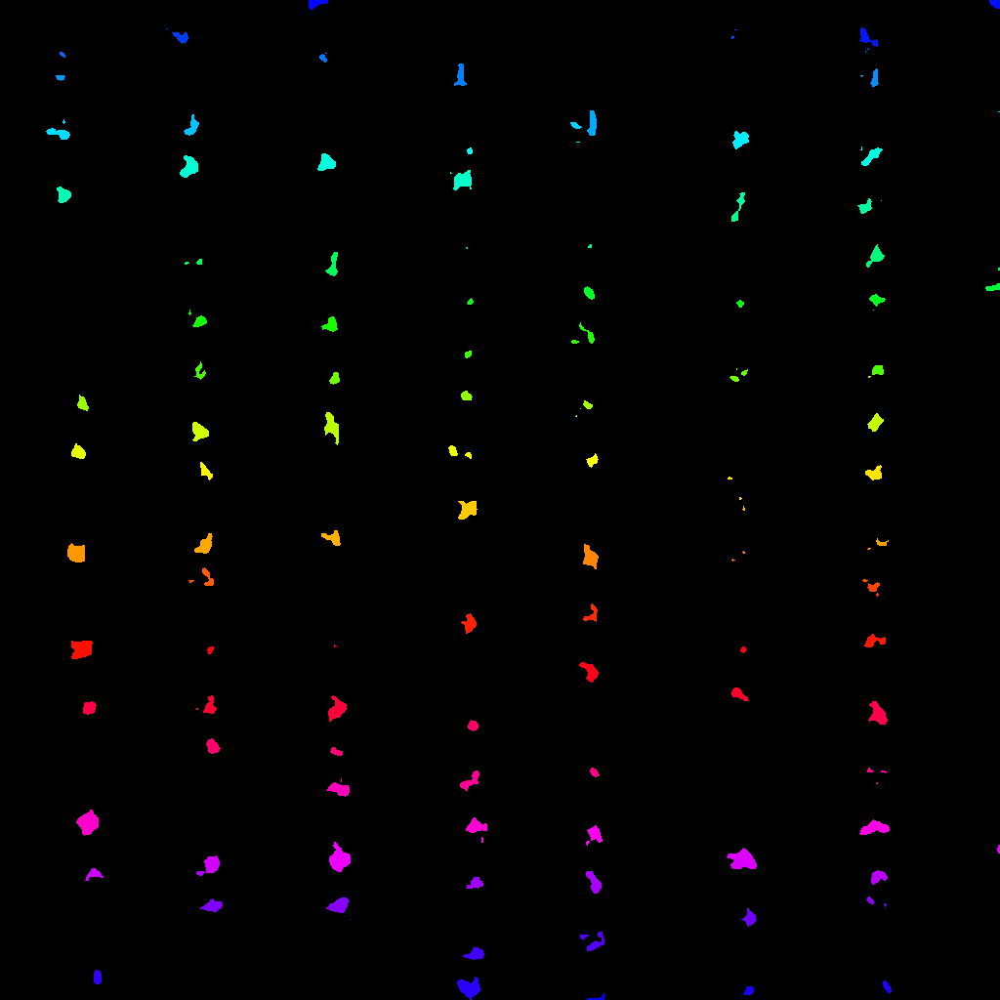

In [16]:
label_hue = np.uint8(179*labels/np.max(labels))
blank_ch = 255*np.ones_like(label_hue)
labeled_img = cv.merge([label_hue, blank_ch, blank_ch])

# Converting cvt to BGR
labeled_img = cv.cvtColor(labeled_img, cv.COLOR_HSV2BGR)
# set bg label to black
labeled_img[label_hue==0] = 0
cv.cvtColor(labeled_img, cv.COLOR_BGR2RGB)
Image.fromarray(labeled_img)

In [17]:
df

,cx,cy,bx,by,width,height,num_pixels
1,323.440000,3.080000,316,0,20,10,125
2,1018.784810,3.341772,1013,0,11,9,79
3,887.506494,38.207792,880,28,19,20,154
4,170.500000,29.000000,170,29,2,1,2
5,753.000000,30.000000,752,30,3,1,3
...,...,...,...,...,...,...,...
142,99.446602,1000.271845,96,993,8,15,103
143,480.231231,1010.993994,468,1000,25,24,333
144,907.826087,1010.159420,904,1004,9,13,69
145,766.640000,1014.160000,761,1010,11,9,75


---
## Hough

In [18]:
def in_circular_interval(inf, sup, value, interval_max):
    sup = sup % interval_max
    inf = inf % interval_max
    if sup > inf:
        return (inf < value) & (value < sup)
    elif sup == inf:
        return value == inf
    else:
        return (value < sup) | (value > inf)

In [19]:
def get_line_boxes(theta, rho, is_deg, img_width, img_height):
    if is_deg:
        theta = np.deg2rad(theta)
    # a = np.cos(theta)
    # b = np.sin(theta)
    # x0 = a*rho + imgc.shape[0] / 2
    # y0 = b*rho + imgc.shape[1] / 2
    # x1 = int(x0 + 10000 * (-b))
    # x1 = x1 if x1 > 0 else 0
    # y1 = int(y0 + 10000 * a)
    # y1 = y1 if y1 > 0 else 0
    # x2 = int(x0 - 10000 * (-b))
    # x2 = x2 if x2 < img_lines.shape[0] else img_lines.shape[0] -1
    # y2 = int(y0 - 10000 * a)
    # y2 = y2 if y2 < img_lines.shape[1] else img_lines.shape[1] -1
    # return (x1, y1), (x2, y2)
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = (a * rho) + img_width / 2
    y0 = (b * rho) + img_height / 2
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    return (x1, y1), (x2, y2)

In [20]:
def max_displacement(width, height):
    return int(width / 2 if width > height else height / 2)
def mean_displacement(width, height):
    return int((width + height) / 4)
displacement_function = max_displacement

In [21]:
def get_mask(connected_img, connection_dataframe, displacement_function):
    displ_mask = np.zeros(connected_img.shape, dtype=np.uint8)
    for idx, (x, y, bx, by, width, height, num_pixels) in connection_dataframe.iterrows():
        displacement = displacement_function(width, height)
        c1 = int(x - displacement), int(y - displacement)
        c2 = int(x + displacement), int(y + displacement)
        # cv.circle(imgc, (int(x), int(y)), 10, (255, 0, 0), 5)
        cv.rectangle(displ_mask, c1, c2, (255, 255, 255), -1)
    return displ_mask

In [106]:
def get_hough(input_img, connection_dataframe, displacement_function):
    width, height, _ = input_img.shape

    step_rho = 1
    step_theta = 1
    d = np.sqrt(np.square(height) + np.square(width))
    thetas = np.arange(0, 180, step=step_theta)
    rhos = np.arange(-d, d, step=step_rho)
    print(d)
    cos_thetas = np.cos(np.deg2rad(thetas))
    sin_thetas = np.sin(np.deg2rad(thetas))

    # Hough accumulator array of theta vs rho
    accumulator = np.zeros((len(thetas), len(rhos)))
    for idx, (x, y, bx, by, pwidth, pheight, num_pixels) in connection_dataframe.iterrows():
        displacement = displacement_function(pwidth, pheight)
        point = (y - height / 2, x - width / 2)
        for theta_idx in range(len(thetas)):
            rho = (point[1] * cos_thetas[theta_idx]) + (point[0] * sin_thetas[theta_idx])
            theta = thetas[theta_idx]
            rho_idx = np.argmin(np.abs(rhos - rho))
            accumulator[theta, rho_idx - displacement: rho_idx + displacement] += 1
    return accumulator

In [108]:
def get_theta_rho(accumulator, threshold):
    theta_vec, rho_vec = np.where(accumulator > threshold)
    return pd.DataFrame({'theta': theta_vec, 'rho': rho_vec - d})

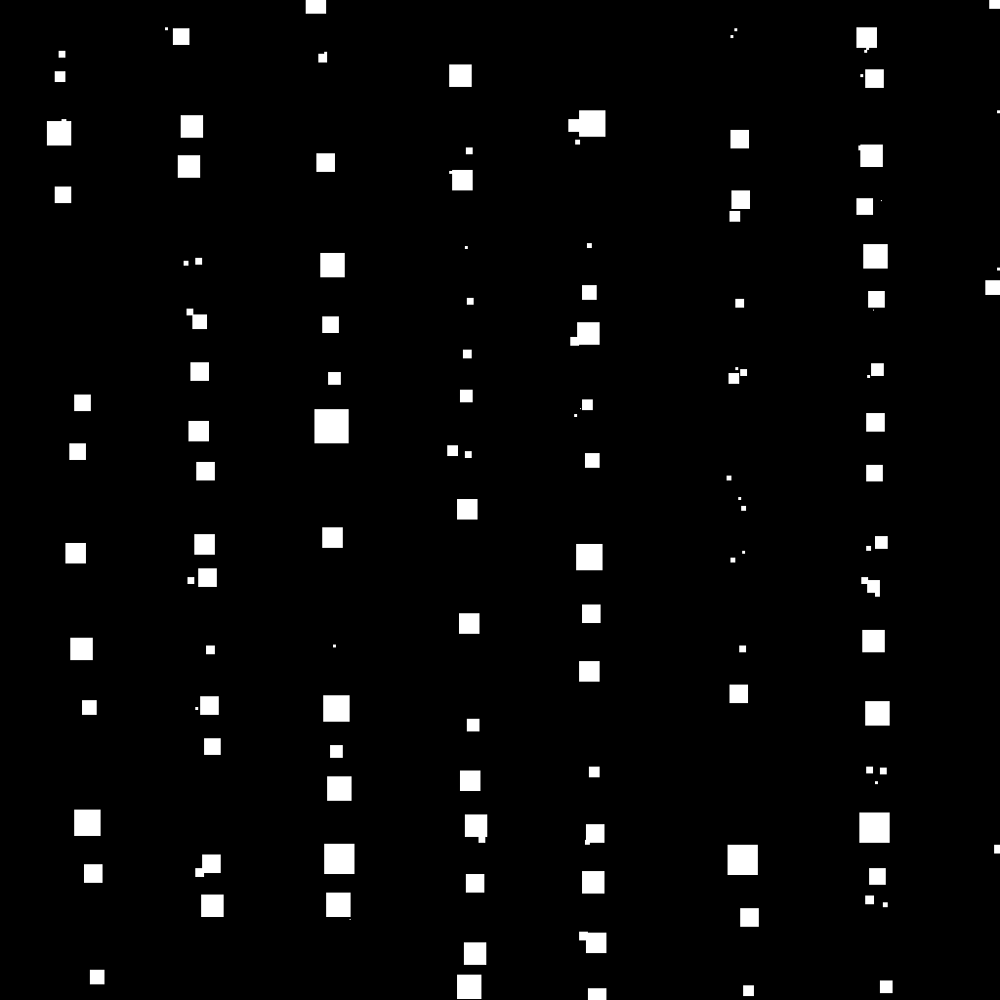

In [24]:
displ_mask = get_mask(imgc, df, displacement_function)
Image.fromarray(displ_mask)

In [107]:
acc = get_hough(imgc, df, displacement_function)

1448.1546878700494


In [26]:
np.bincount(acc.astype(np.int).flatten())

C:\Users\pasqu\AppData\Local\Temp\ipykernel_24300\1294234627.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.bincount(acc.astype(np.int).flatten())


array([353854,  68835,  54571,  28953,  10826,   3005,    684,    244,
          127,     85,     69,     50,     61,     39,     34,      9,
           10,      2,      1,      0,      1], dtype=int64)

In [109]:
theta_rho = get_theta_rho(acc, 10)

In [111]:
theta_rho['rho'].max()

433.84531212995057

In [112]:
theta_rho['m'] = theta_rho['theta'].map(lambda x: - np.cos(x) / np.sin(x))
theta_rho['b'] = theta_rho['rho'] / np.sin(theta_rho['theta'])
median = theta_rho['theta'].median()
mode = theta_rho['theta'].mode()[0]
error = 3
# theta_rho_reduced = theta_rho
# theta_rho_reduced = theta_rho[(theta_rho['theta'] > median - 10) & (theta_rho['theta'] < median + 10)]
# theta_rho_reduced = theta_rho[theta_rho['theta'] == int(median)]
# theta_rho_reduced = theta_rho[theta_rho['theta'] == int(mode)]
theta_rho_reduced = theta_rho[in_circular_interval(mode - error, mode + error, theta_rho['theta'], 180)]

C:\Users\pasqu\AppData\Local\Temp\ipykernel_24300\3013269720.py:1: RuntimeWarning: divide by zero encountered in double_scalars
  theta_rho['m'] = theta_rho['theta'].map(lambda x: - np.cos(x) / np.sin(x))


In [114]:
theta_rho_reduced

,theta,rho,m,b
0,0,-306.154688,-inf,-inf
1,0,-301.154688,-inf,-inf
2,0,-174.154688,-inf,-inf
3,0,-173.154688,-inf,-inf
4,0,-172.154688,-inf,-inf
...,...,...,...,...
202,179,304.845312,14.104433,4310.463381
203,179,305.845312,14.104433,4324.603219
204,179,306.845312,14.104433,4338.743058
205,179,307.845312,14.104433,4352.882896


In [91]:
theta_rho['rho']

0      1142
1      1147
2      1274
3      1275
4      1276
       ... 
202    1753
203    1754
204    1755
205    1756
206    1757
Name: rho, Length: 207, dtype: int64

In [123]:
theta_rho_reduced[1:2]

,theta,rho,m,b
1,0,-301.154688,-inf,-inf


In [120]:
theta_rho_reduced[60:61]

,theta,rho,m,b
60,1,386.845312,-0.642093,459.725076


In [124]:
p1, p2 = get_line_boxes(0, -301, False, width, height)
print(p1, p2)

(211, 1512) (211, -488)


In [126]:
p1, p2 = get_line_boxes(1, 386, False, width, height)
print(p1, p2)

(-120, 1377) (1562, 296)


(0.0, -306.15468787004943) (205, 1512) (205, -488)
(0.0, -301.15468787004943) (210, 1512) (210, -488)
(0.0, -174.15468787004943) (337, 1512) (337, -488)
(0.0, -173.15468787004943) (338, 1512) (338, -488)
(0.0, -172.15468787004943) (339, 1512) (339, -488)
(0.0, -171.15468787004943) (340, 1512) (340, -488)
(0.0, -170.15468787004943) (341, 1512) (341, -488)
(0.0, -169.15468787004943) (342, 1512) (342, -488)
(0.0, -35.15468787004943) (476, 1512) (476, -488)
(0.0, -34.15468787004943) (477, 1512) (477, -488)
(0.0, -33.15468787004943) (478, 1512) (478, -488)
(0.0, -32.15468787004943) (479, 1512) (479, -488)
(0.0, -31.15468787004943) (480, 1512) (480, -488)
(0.0, -30.15468787004943) (481, 1512) (481, -488)
(0.0, -29.15468787004943) (482, 1512) (482, -488)
(0.0, 86.84531212995057) (598, 1512) (598, -488)
(0.0, 87.84531212995057) (599, 1512) (599, -488)
(0.0, 88.84531212995057) (600, 1512) (600, -488)
(0.0, 89.84531212995057) (601, 1512) (601, -488)
(0.0, 90.84531212995057) (602, 1512) (602, -48

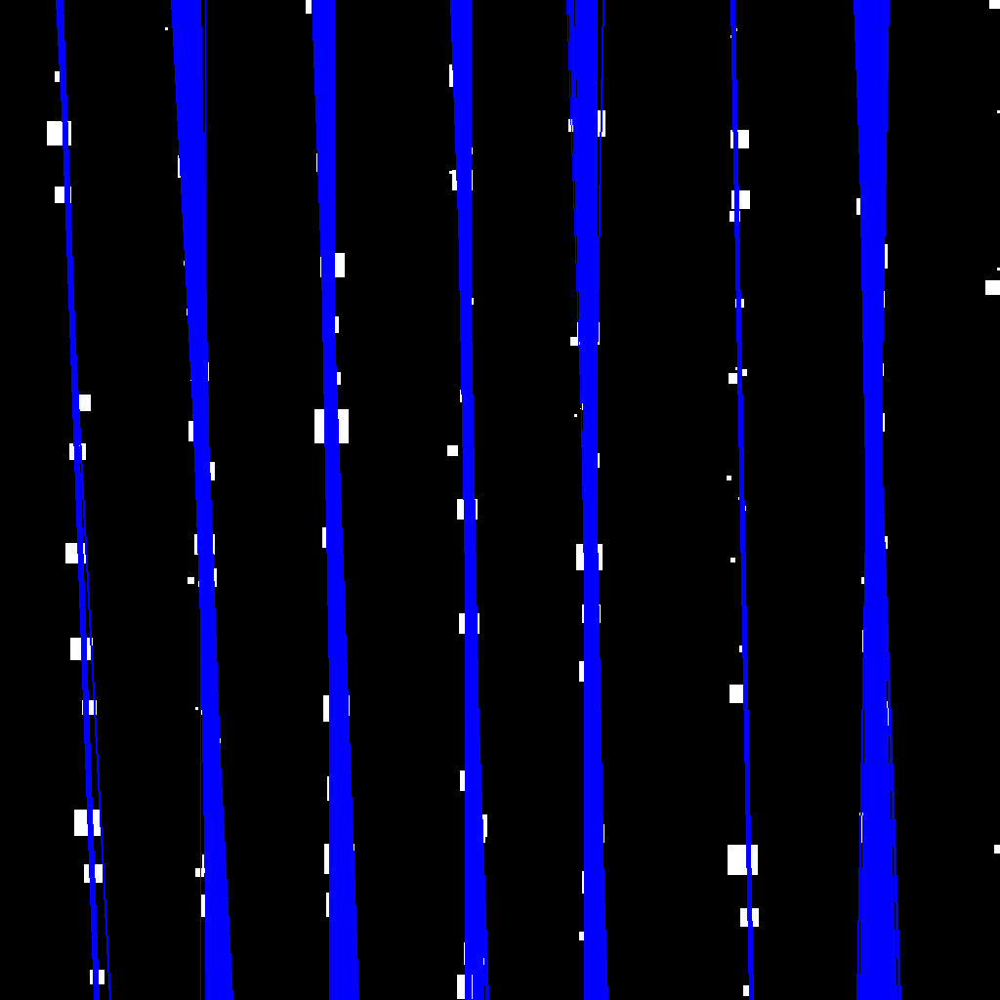

In [129]:
img_lines = np.array(displ_mask)
width, height, _ = imgc.shape
for idx, (theta, rho, m, b) in theta_rho_reduced.iterrows():
    p1, p2 = get_line_boxes(theta, rho, True, width, height)
    print((theta, rho), p1, p2)
    cv.line(img_lines, p1, p2, (0,0,255), 1)
Image.fromarray(img_lines)

---
## Lines per point

(-508.92, -188.56)
120 -346.15468787004943
(-180, -287) (1551, 712)


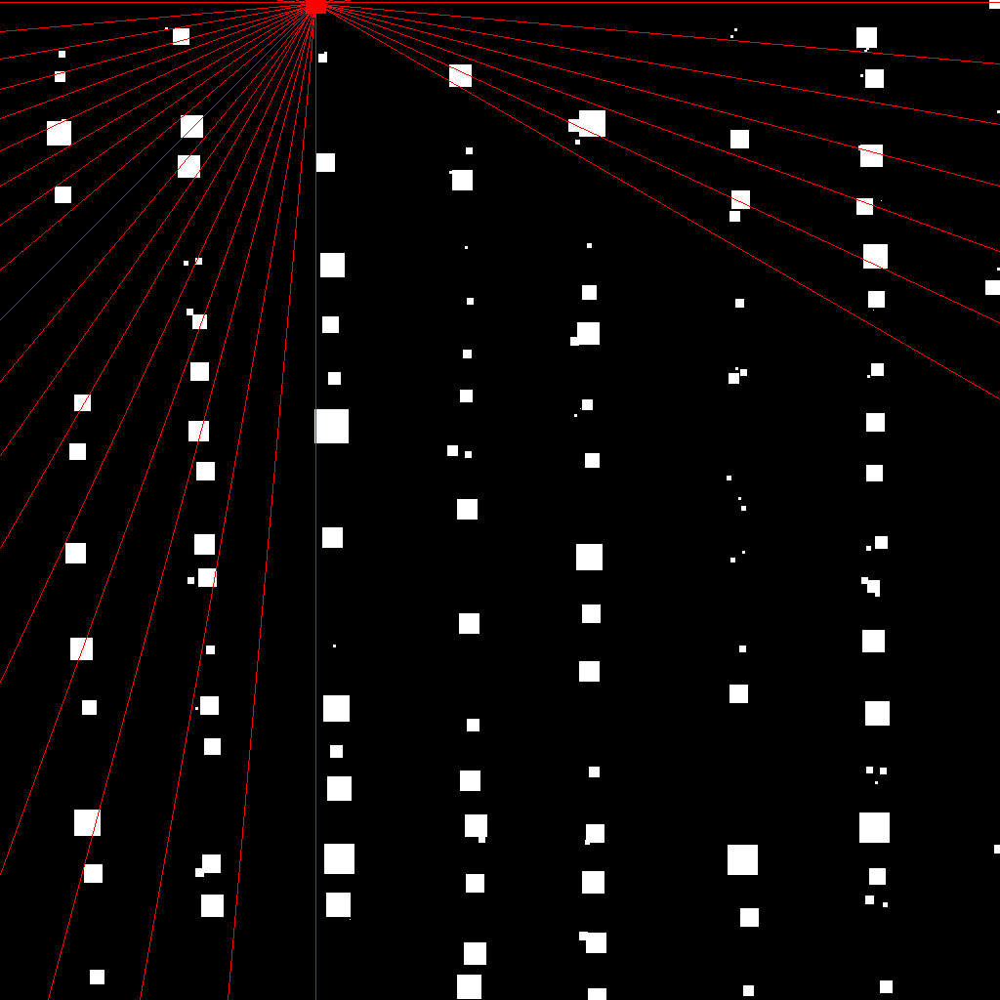

KeyboardInterrupt: 

In [104]:
new_ppi = np.array(displ_mask)
width, height, _ = imgc.shape

step_rho = 1
step_theta = 5
d = np.sqrt(np.square(height) + np.square(width))
thetas = np.arange(0, 180, step=step_theta)
rhos = np.arange(-d, d, step=step_rho)
cos_thetas = np.cos(np.deg2rad(thetas))
sin_thetas = np.sin(np.deg2rad(thetas))

# Hough accumulator array of theta vs rho
accumulator = np.zeros((len(rhos), len(thetas)))
# vec = {'rho': [], 'theta': []}
# Vote in the hough accumulator
for i, (x, y, bx, by, width_r, height_r, num_pixels) in df.reset_index(drop=True).iterrows():
    displacement = displacement_function(width_r, height_r)
    c1 = int(x - displacement), int(y - displacement)
    c2 = int(x + displacement), int(y + displacement)
    cv.rectangle(new_ppi, c1, c2, (255, 0, 0), -1)
    point = (y - height / 2, x - width / 2)
    for theta_idx in range(len(thetas)):
        rho = (point[1] * cos_thetas[theta_idx]) + (point[0] * sin_thetas[theta_idx])
        theta = thetas[theta_idx]
        a = np.cos(np.deg2rad(theta))
        b = np.sin(np.deg2rad(theta))
        rho_idx = np.argmin(np.abs(rhos - rho))
        rho = rhos[rho_idx]
        x0 = (a * rho) + width / 2
        y0 = (b * rho) + height / 2
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv.line(new_ppi, (x1, y1), (x2, y2), 255, 1)
        clear_output()
        print(point)
        print(theta, rho)
        print((x1, y1), (x2, y2))
        display(Image.fromarray(new_ppi))
        time.sleep(1)
        # break
        # vec['rho'].append(rho)
        # vec['theta'].append(theta)
    # break
    cv.rectangle(new_ppi, c1, c2, (255, 255, 255), -1)

In [69]:
df_vec = pd.DataFrame(vec)

In [70]:
rho = df_vec.loc[0, 'rho']
theta = df_vec.loc[0, 'theta']
width, height, _ = imgc.shape
a = np.cos(np.deg2rad(theta))
b = np.sin(np.deg2rad(theta))
x0 = (a * rho) + width / 2
y0 = (b * rho) + height / 2
x1 = int(x0 + 1000 * (-b))
y1 = int(y0 + 1000 * (a))
x2 = int(x0 - 1000 * (-b))
y2 = int(y0 - 1000 * (a))
print(theta, rho)
print((x1, y1), (x2, y2))
p1, p2 = get_line_boxes(theta, rho, False, width, height)
print(p1, p2)

0 -188.56
(323, 1512) (323, -488)
(323, 1512) (323, -488)


In [84]:
df_vec['rho'].max()

639.222145939318

---
## Example

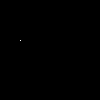

In [3]:
point = 40, 20
width, height = 100, 100
ex_img = np.zeros((width, height), np.uint8)
ex_img[point] = 255
Image.fromarray(ex_img)

In [4]:
step_rho = 1
step_theta = 5
d = np.sqrt(np.square(height) + np.square(width))
thetas = np.arange(0, 180, step=step_theta)
rhos = np.arange(-d, d, step=step_rho)
cos_thetas = np.cos(np.deg2rad(thetas))
sin_thetas = np.sin(np.deg2rad(thetas))

175 29.014283515275785


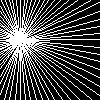

In [11]:
ex_img_copy = np.array(ex_img)
for theta_idx in range(len(thetas)):
    rho = ((point[1] - height / 2) * cos_thetas[theta_idx]) + ((point[0] - width / 2) * sin_thetas[theta_idx])
    theta = thetas[theta_idx]
    a = np.cos(np.deg2rad(theta))
    b = np.sin(np.deg2rad(theta))
    x0 = (a * rho) + width / 2
    y0 = (b * rho) + height / 2
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv.line(ex_img_copy, (x1, y1), (x2, y2), 255, 1)
    clear_output()
    print(theta, rho)
    display(Image.fromarray(ex_img_copy))
    time.sleep(1)

In [9]:
ex_img_copy = cv.line(ex_img_copy, (10, 10), (30, 30), 255, 2)
ex_img_copy

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

# CropRowDetector

In [27]:
from detector import CropRowDetector
from PIL import Image
from torchvision.transforms import ToTensor
import torch.nn.functional as F
import torch
import numpy as np
import pandas as pd
import cv2 as cv

In [3]:
crd = CropRowDetector(use_cuda=False)

Some weights of the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 were not used when initializing SegformerModel: ['decode_head.batch_norm.num_batches_tracked', 'decode_head.linear_c.1.proj.weight', 'decode_head.batch_norm.bias', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.running_var', 'decode_head.linear_c.0.proj.weight', 'decode_head.batch_norm.running_mean', 'decode_head.linear_fuse.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.batch_norm.weight', 'decode_head.classifier.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.classifier.bias']
- This IS expected if you are initializing SegformerModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Segforme

In [4]:
img = Image.open("./dataset/DJI_1020_0.JPG")
t = ToTensor()(img)
t = torch.unsqueeze(t, 0)

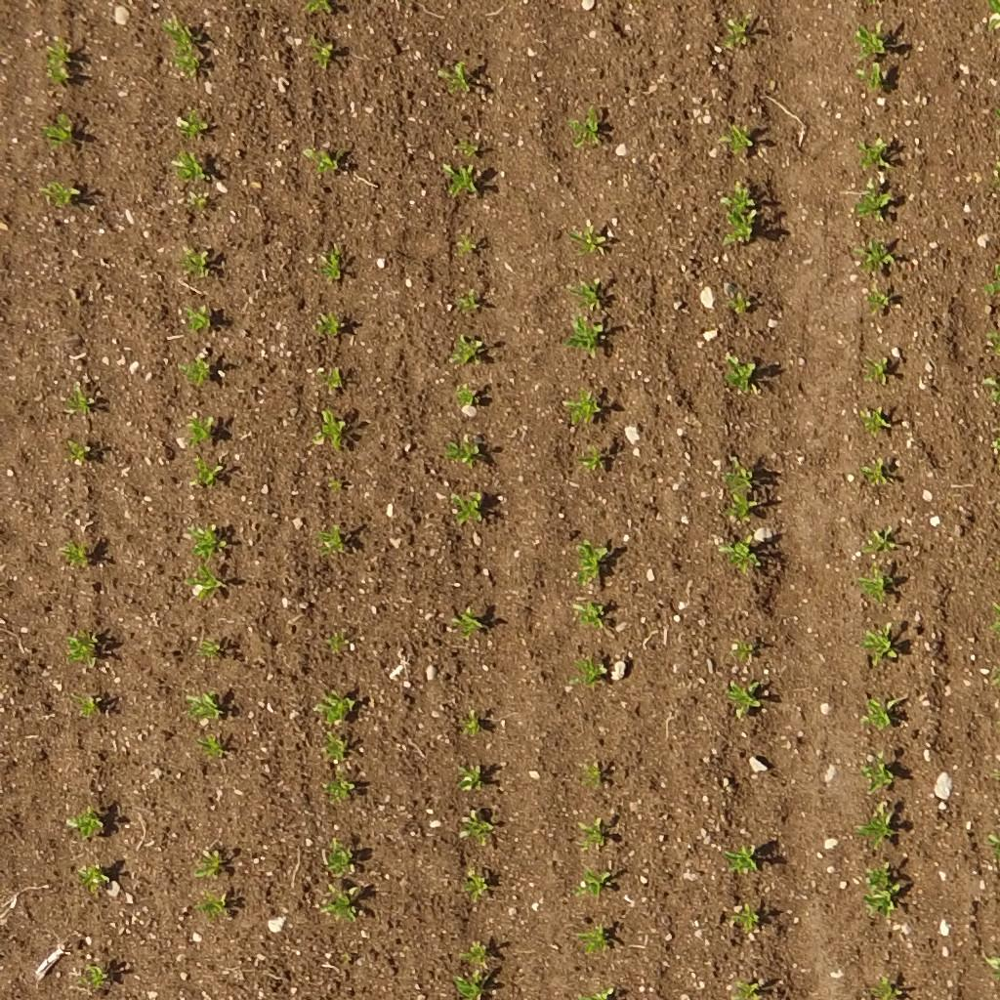

In [5]:
img

In [151]:
lines = crd.predict(t)

## Step per step

In [9]:
crop_mask = crd.detect_crop(t)

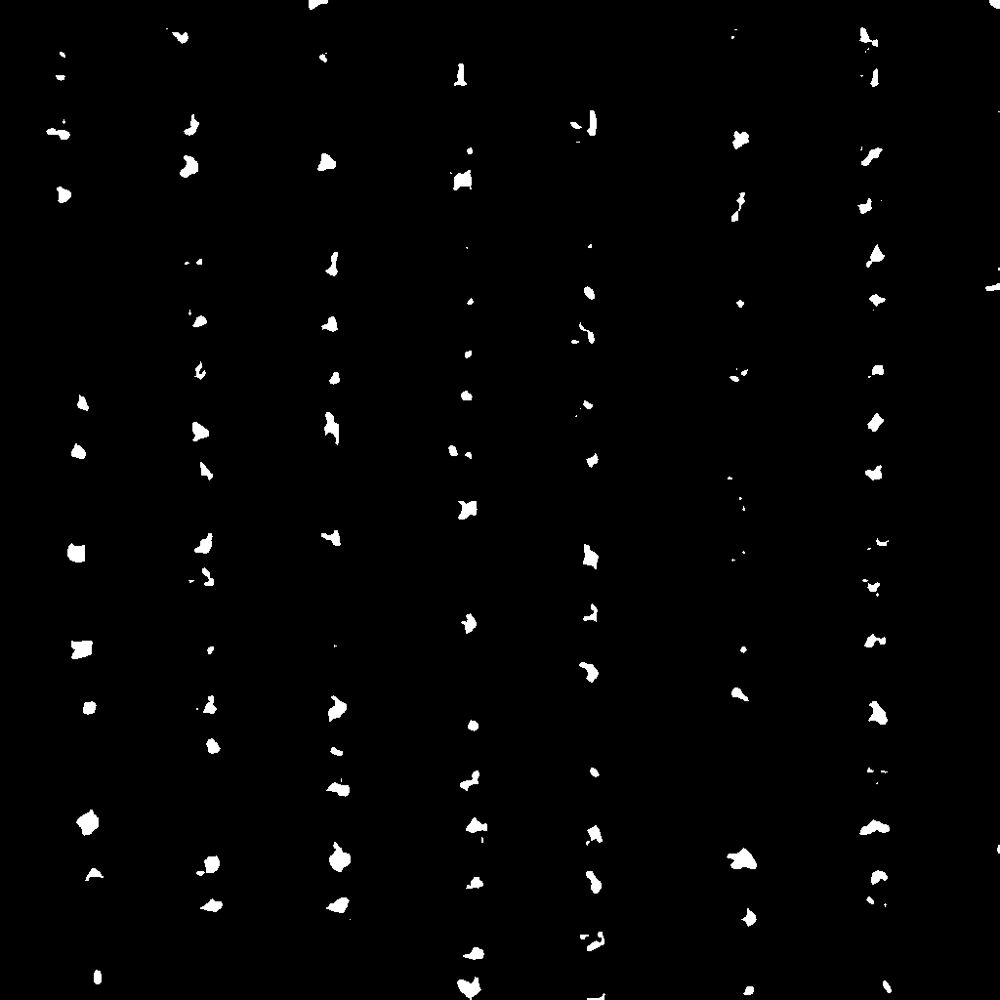

In [10]:
Image.fromarray((crop_mask.cpu().squeeze(0).numpy()).astype(np.uint8))

In [11]:
connectivity_df = crd.calculate_connectivity(crop_mask.squeeze(0).cpu().numpy().astype(np.uint8))

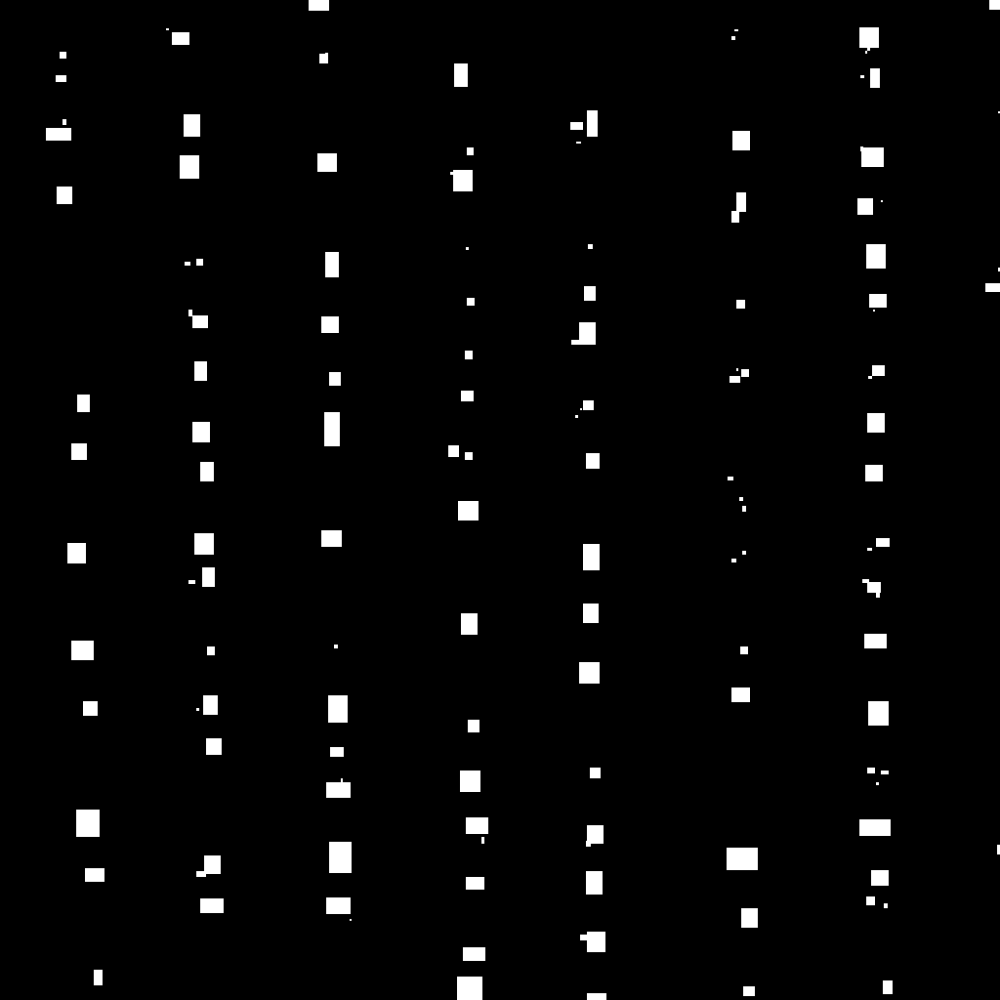

In [14]:
mask = np.zeros(np.array(img).shape, dtype=np.uint8)
for idx, (x, y, bx, by, width, height, num_pixels) in connectivity_df.iterrows():
    c1 = int(bx), int(by)
    c2 = int(bx + width), int(by + height)
    cv.rectangle(mask, c1, c2, (255, 255, 255), -1)
Image.fromarray(mask)

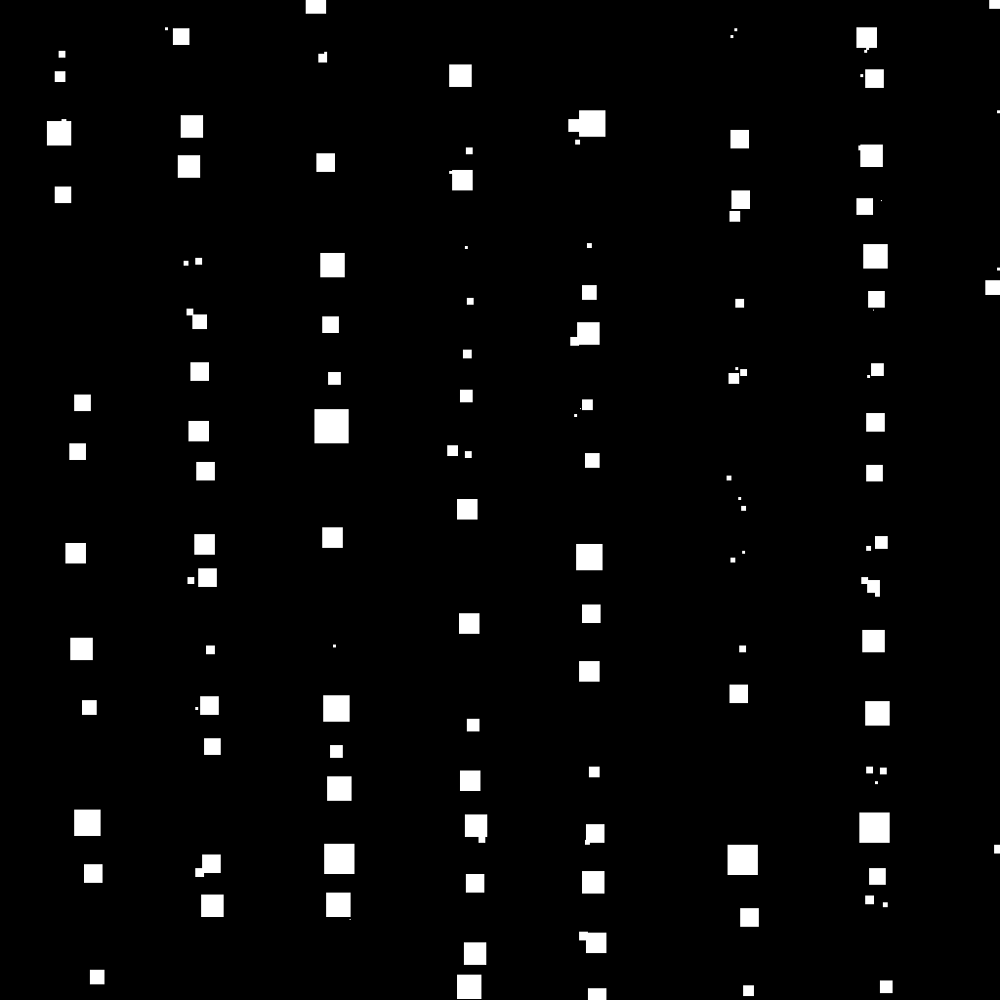

In [15]:
enhanced_mask = crd.calculate_mask(crop_mask.shape[1:], connectivity_df)
Image.fromarray(enhanced_mask)

In [16]:
theta_rho = crd.hough(enhanced_mask, connectivity_df)
theta_rho

,theta,rho
0,0,-306.154688
1,0,-301.154688
2,0,-174.154688
3,0,-173.154688
4,0,-172.154688
...,...,...
202,179,304.845312
203,179,305.845312
204,179,306.845312
205,179,307.845312


In [47]:
lines = crd.filter_lines(theta_rho)

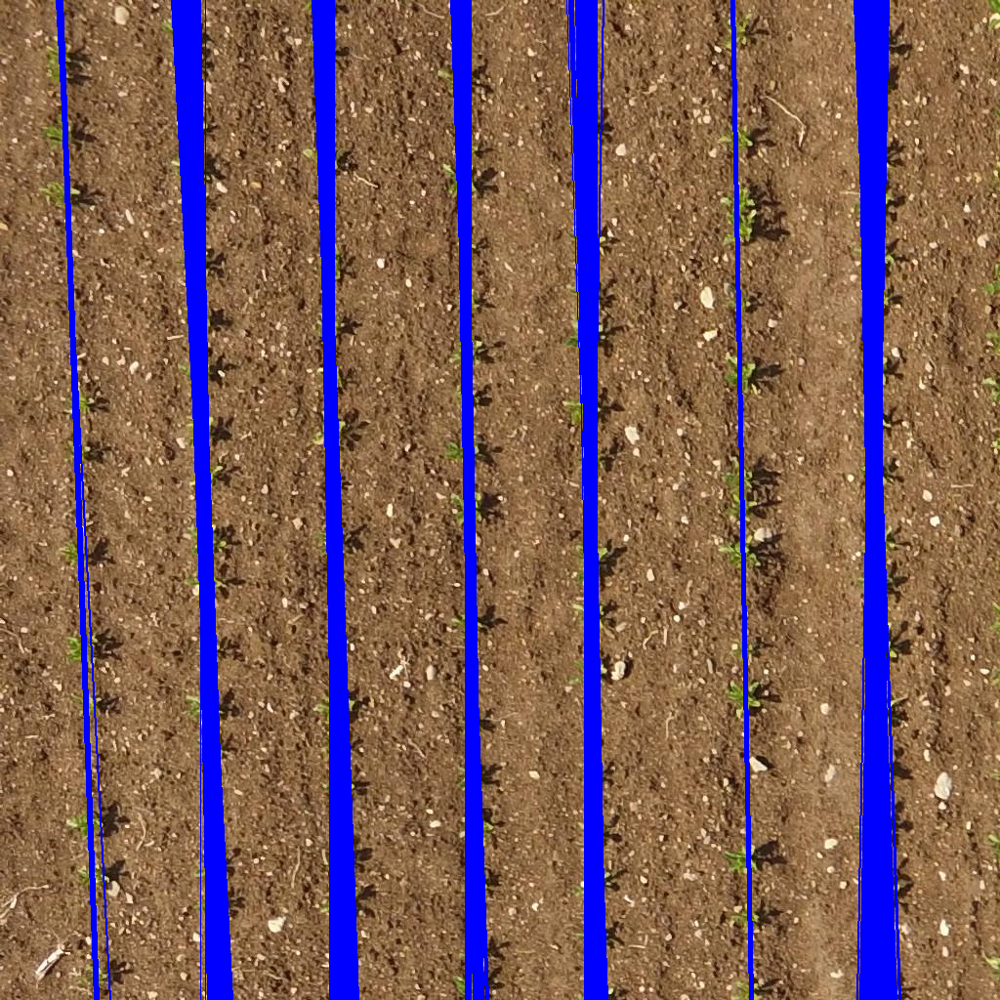

In [20]:
img_lines = (t.squeeze(0).permute(1, 2, 0).numpy().copy() * 255).astype(np.uint8)
width, height, _ = img_lines.shape
for idx, (theta, rho) in lines.iterrows():
    p1, p2 = get_line_boxes(theta, rho, True, width, height)
    cv.line(img_lines, p1, p2, (0,0,255), 1)
Image.fromarray(img_lines)

<AxesSubplot: ylabel='Density'>

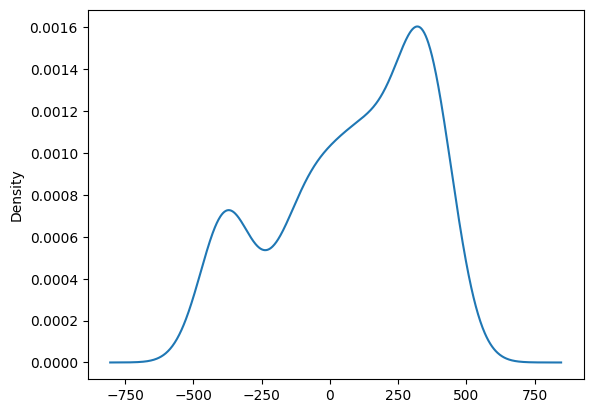

In [229]:
lines['rho'].plot.kde()

In [48]:
lines['sign'] = np.sign(np.cos(np.deg2rad(lines['theta'])))
lines['frho'] = lines['rho'] * np.sign(np.cos(np.deg2rad(lines['theta'])))

/tmp/ipykernel_193735/725113058.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lines['sign'] = np.sign(np.cos(np.deg2rad(lines['theta'])))
/tmp/ipykernel_193735/725113058.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lines['frho'] = lines['rho'] * np.sign(np.cos(np.deg2rad(lines['theta'])))


In [49]:
lines

,theta,rho,sign,frho
0,0,-306.154688,1.0,-306.154688
1,0,-301.154688,1.0,-301.154688
2,0,-174.154688,1.0,-174.154688
3,0,-173.154688,1.0,-173.154688
4,0,-172.154688,1.0,-172.154688
...,...,...,...,...
202,179,304.845312,-1.0,-304.845312
203,179,305.845312,-1.0,-305.845312
204,179,306.845312,-1.0,-306.845312
205,179,307.845312,-1.0,-307.845312


In [24]:
d = np.sqrt(1024**2 + 1024**2)
rg = np.arange(-d, d)

In [51]:
clusters = []
for idx, (theta, rho, sign, frho) in lines.iterrows():
    broke = False
    for cluster in clusters:
        for _, _, value in cluster:
            if abs(frho - value) < 2:
                cluster.append((theta, rho, frho))
                broke = True
                break
        if broke:
            break
    if not broke:
        clusters.append([(theta, rho, frho)])

In [53]:
centroids = [pd.DataFrame(cluster, columns=['theta', 'rho', 'frho']).mean() for cluster in clusters]
centroids_d = {'theta': [], "rho": []}
for mean_df in centroids:
    centroids_d['theta'].append(mean_df['theta'])
    centroids_d['rho'].append(mean_df['rho'])
centroids = pd.DataFrame(centroids_d)

169.61904761904762 277.5119787966173
166.875 263.22031212995057
135.76 89.36531212995058
119.14285714285714 10.654835939474381
99.33333333333333 -9.404687870049429
86.64516129032258 11.522731484789288
177.0 426.34531212995057
178.16666666666666 165.01197879661723
178.25 296.84531212995057
178.0 431.3453121299506
179.0 -248.15468787004943
179.0 26.34531212995057


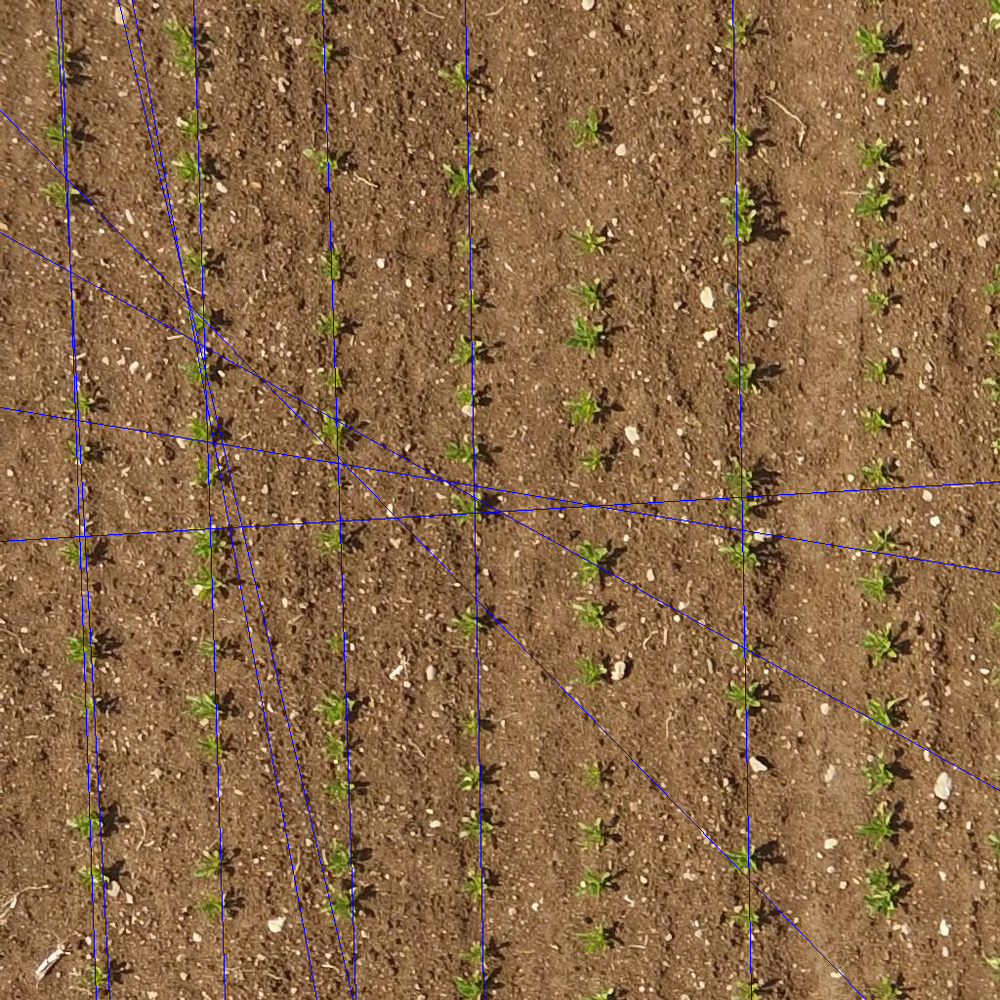

In [54]:
img_lines = (t.squeeze(0).permute(1, 2, 0).numpy().copy() * 255).astype(np.uint8)
width, height, _ = img_lines.shape
for idx, (theta, rho) in centroids.iterrows():
    print(theta, rho)
    p1, p2 = get_line_boxes(theta, rho, True, width, height)
    cv.line(img_lines, p1, p2, (0,0,255), 1)
Image.fromarray(img_lines)
# https://towardsdatascience.com/lines-detection-with-hough-transform-84020b3b1549